# `l2hmc`: Example

<a href="https://arxiv.org/abs/2105.03418"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2105.03418-B31B1B.svg" align="left"></a> <a href="https://arxiv.org/abs/2112.01582"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2112.01582-B31B1B.svg" align="left" style="margin-left:10px;"></a><br>


This notebook will (attempt) to walk through the steps needed to successfully instantiate and "run" an experiment.

For this example, we wish to train the L2HMC sampler for the 2D $U(1)$ lattice gauge model with Wilson action:

$$
S_{\beta}(n) = \beta \sum_{n}\sum_{\mu<\nu}\mathrm{Re}\left[1 - U_{\mu\nu}(n) \right]
$$

This consists of the following steps:
  1. Build an `Experiment` by parsing our configuration object
  2. Train our model using the `Experiment.train()` method
  3. Evaluate our trained model `Experiment.evaluate(job_type='eval')`
  4. Compare our trained models' performance against generic HMC `Experiment.evaluate(job_type='hmc')`
  

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Evaluating Performance</u></b>
    
Explicitly, we measure the performance of our model by comparing the _tunneling rate_ $\delta Q$ of our **trained** sampler to that of generic HMC.
    
Explicitly, the tunneling rate is given by:
    
$$
\delta Q = \frac{1}{N_{\mathrm{chains}}}\sum_{\mathrm{chains}} \left|Q_{i+1} - Q_{i}\right|
$$
    
where the difference is between subsequent states in a chain, and the sum is over all $N$ chains (each being ran in parallel, _independently_).
    
Since our goal is to generate _independent configurations_, the more our sampler tunnels between different topological sectors (_tunneling rate_), the more efficient our sampler.
    
</div>


## Imports

In [1]:
import os
print(os.environ['CUDA_VISIBLE_DEVICES'])
!getconf _NPROCESSORS_ONLN

7
256


In [2]:
os.environ['OMP_NUM_THREADS'] = '256'

In [3]:
import warnings
warnings.filterwarnings('ignore')
os.environ['TORCH_CPP_LOG_LEVEL'] = 'ERROR'

In [4]:
from __future__ import absolute_import, print_function, annotations, division

# automatically detect and reload local changes to modules
%load_ext autoreload
%autoreload 2

# unset verbose TF XLA Flags
!unset TF_XLA_FLAGS
!unset KMP_AFFINITY KMP_SETTINGS

import os

import hydra
import torch
import tensorflow as tf
import numpy as np
    
from l2hmc.main import setup, setup_tensorflow, setup_torch

_ = setup_torch(
    precision='float32',
    backend='DDP',
    seed=1234,
)

_ = setup_tensorflow(
    precision='float32',
)

from hydra.core.global_hydra import GlobalHydra
from l2hmc.utils.rich import print_config

--------------------------------------------------------------------------

  Local host:   thetagpu14
  Local device: mlx5_0
--------------------------------------------------------------------------
Using: float32 precision


In [5]:
import logging
from rich.style import Style
from rich.console import Console
from rich.logging import RichHandler
from l2hmc.utils.rich import get_console

log = logging.getLogger()
log.setLevel('INFO')

tlog = logging.getLogger('torch')
tlog.setLevel('ERROR')

wblog = logging.getLogger('wandb')
wblog.setLevel('CRITICAL')

# `ExperimentConfig`

Set some reasonable defaults for our experiments

In [6]:
#GlobalHydra.instance().clear()

defaults = [
    'steps.nera=5',
    'steps.nepoch=100',
    'steps.print=50',
    'steps.test=2000',
]

defaults_u1 = [
    *defaults,
    'network.use_batch_norm=false',
    'annealing_schedule.beta_init=4.0',
    'annealing_schedule.beta_final=5.0',
]

defaults_su3 = [
    *defaults,
    'dynamics=su3',
    'dynamics.nchains=5',
    'steps.nera=0',
    'steps.nepoch=0',
    'dynamics.latvolume=[8, 8, 8, 16]',
    'annealing_schedule.beta_init=0.7796',
    'annealing_schedule.beta_final=0.7796',
]

In [7]:
outputs = {
    'pytorch': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
    'tensorflow': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
}

# Initialize and Build `Experiment` objects:

- The `l2hmc.configs` module provides a function `get_experiment`:

```python
def get_experiment(overrides: list[str]) -> Experiment:
    ...
```

which will:

1. Load the default options from `conf/config.yaml`
2. Override the default options with any values provided in `overrides`
3. Parse these options and build an `ExperimentConfig` which uniquely defines an experiment
3. Instantiate / return an `Experiment` from the `ExperimentConfig`

```python
>>> train_output = experiment.train()
>>> eval_output = experiment.evaluate(job_type='eval')
>>> hmc_output = experiment.evaluate(job_type='hmc')
```

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Overriding Defaults</u></b>

Specifics about the training / evaluation / hmc runs can be flexibly overridden by passing arguments to the training / evaluation / hmc runs, respectively
</div>

In [8]:
import gc
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

In [9]:
from l2hmc.configs import get_experiment

ptExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=pytorch',
        'init_wandb=false',
        'init_aim=false',
    ]
)

21:23:54 INFO     Using horovod for distributed training                                                   ]8;id=462141;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=7855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

21:23:59 DEBUG    Built networks.                                                                        ]8;id=955227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=984894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#147\147]8;;\

         DEBUG    dynamics._networks_built: True                                                         ]8;id=846203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=36622;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#157\157]8;;\

         INFO     Looking for checkpoints in:                                                             ]8;id=726754;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=103202;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#358\358]8;;\
                   /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/che               
                  ckpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16-32_4-4-4-4_2-2-2-2               
                  /16-16-16-16_dp-0.0_bn-False/pytorch                                                                  

         INFO     Loading model from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hm ]8;id=803713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=248313;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#379\379]8;;\
                  c-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16               
                  -32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/model.pth                                     

21:24:03 INFO     Loading checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects ]8;id=18274;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=827088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#383\383]8;;\
                  /l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4               
                  -8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-4-0-2022-11-05-201400               
                  .tar                                                                                                  

21:24:11 WARNING  Using `torch.optim.Adam` optimizer                                                      ]8;id=16609;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=679808;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#142\142]8;;\

21:24:12 INFO     Using horovod for distributed training                                                   ]8;id=653557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=507768;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

In [10]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
        'init_wandb=false',
        'init_aim=false',
    ]
)

21:24:14 DEBUG    Setting JobRuntime:name=app                                                               ]8;id=486065;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py\utils.py]8;;\:]8;id=95721;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py#279\279]8;;\

## PyTorch

─────────────────────────────────────────────── ERA: 0 / 5, BETA: 4.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

21:24:40 INFO     era=0   epoch=0   tstep=0   dt=2.1251 beta=4.0000 loss=-541.2974 dQsin=1.7909          ]8;id=191984;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=119970;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=4.2798 energy=1297.7646 logprob=1291.6659 logdet=6.0988 sldf=13.4998                            
                  sldb=-13.4545 sld=6.0988 xeps=0.2411 veps=0.1870 acc=0.9096 sumlogdet=0.0110                          
                  acc_mask=0.9092 plaqs=0.0006 intQ=0.1172 sinQ=0.0273 lr=0.0010                                        

21:29:29 INFO     era=0   epoch=50  tstep=50  dt=1.3407 beta=4.0000 loss=-23.2520 dQsin=0.2349           ]8;id=886412;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=15328;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.2290 energy=411.9689 logprob=406.5587 logdet=5.4103 sldf=12.1425 sldb=-12.1431                
                  sld=5.4103 xeps=0.2412 veps=0.1879 acc=0.3541 sumlogdet=0.0101 acc_mask=0.3491                        
                  plaqs=0.8614 intQ=0.0264 sinQ=0.0208 lr=0.0010                                                        

21:33:30 INFO     Saving took: 0.000110388s                                                              ]8;id=527521;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=923240;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1249\1249]8;;\

         INFO     Era 0 took: 553.244s                                                                   ]8;id=261963;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=699668;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1250\1250]8;;\

─────────────────────────────────────────────── ERA: 1 / 5, BETA: 4.250 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

21:33:46 INFO     era=1   epoch=0   tstep=100 dt=0.6793 beta=4.2500 loss=-25.9840 dQsin=0.2757           ]8;id=567372;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=956631;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.2725 energy=420.2268 logprob=414.2625 logdet=5.9643 sldf=13.0035 sldb=-12.9801                
                  sld=5.9643 xeps=0.2413 veps=0.1880 acc=0.4556 sumlogdet=0.0229 acc_mask=0.4487                        
                  plaqs=0.8633 intQ=-0.0127 sinQ=-0.0077 lr=0.0010                                                      

21:36:55 INFO     era=1   epoch=50  tstep=150 dt=0.6862 beta=4.2500 loss=-15.7022 dQsin=0.2154           ]8;id=488530;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=71900;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.1973 energy=411.4443 logprob=405.3050 logdet=6.1393 sldf=13.0365 sldb=-13.0303                
                  sld=6.1393 xeps=0.2424 veps=0.1865 acc=0.4062 sumlogdet=0.0029 acc_mask=0.4038                        
                  plaqs=0.8721 intQ=-0.0146 sinQ=-0.0122 lr=0.0010                                                      

21:39:48 INFO     Saving took: 0.000128031s                                                              ]8;id=630680;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=707921;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1249\1249]8;;\

         INFO     Era 1 took: 377.651s                                                                   ]8;id=93248;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=540063;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1250\1250]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=607128;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=282680;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1216\1216]8;;\
                   tstep=147.5000, dt=0.6860, beta=4.2500, loss=-19.3015, dQsin=0.2349, dQint=0.2178,                   
                  energy=412.0793, logprob=405.9443, logdet=6.1350, sldf=13.0338, sldb=-13.0090,                        
                  sld=6.1350, xeps=0.2422, veps=0.1867, acc=0.4223, sumlogdet=0.0141, acc_mask=0.4213,                  
                  plaqs=0.8714, intQ=0.0026, sinQ=0.0020, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 2 / 5, BETA: 4.500 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

21:40:04 INFO     era=2   epoch=0   tstep=200 dt=0.6878 beta=4.5000 loss=-14.6570 dQsin=0.2167           ]8;id=864426;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=583461;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.2031 energy=419.8445 logprob=413.4392 logdet=6.4054 sldf=13.4056 sldb=-13.4047                
                  sld=6.4054 xeps=0.2432 veps=0.1852 acc=0.3947 sumlogdet=-0.0067 acc_mask=0.3906                       
                  plaqs=0.8727 intQ=0.0352 sinQ=0.0271 lr=0.0010                                                        

21:43:15 INFO     era=2   epoch=50  tstep=250 dt=0.6831 beta=4.5000 loss=-9.8243 dQsin=0.1792            ]8;id=66141;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=675947;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.1563 energy=412.2823 logprob=406.0455 logdet=6.2368 sldf=12.9854 sldb=-12.9678                
                  sld=6.2368 xeps=0.2434 veps=0.1844 acc=0.4026 sumlogdet=0.0019 acc_mask=0.3940                        
                  plaqs=0.8797 intQ=0.0439 sinQ=0.0368 lr=0.0010                                                        

21:46:17 INFO     Saving took: 0.000386s                                                                 ]8;id=317119;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=504403;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1249\1249]8;;\

         INFO     Era 2 took: 389.151s                                                                   ]8;id=891476;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=372495;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1250\1250]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=279397;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=261254;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1216\1216]8;;\
                   tstep=247.5000, dt=0.7135, beta=4.5000, loss=-10.2041, dQsin=0.1927, dQint=0.1698,                   
                  energy=412.5263, logprob=406.2321, logdet=6.2941, sldf=13.1381, sldb=-13.1138,                        
                  sld=6.2941, xeps=0.2432, veps=0.1845, acc=0.4056, sumlogdet=0.0085, acc_mask=0.4068,                  
                  plaqs=0.8793, intQ=0.0071, sinQ=0.0067, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 3 / 5, BETA: 4.750 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

21:46:33 INFO     era=3   epoch=0   tstep=300 dt=0.6863 beta=4.7500 loss=-6.5838 dQsin=0.1736            ]8;id=687322;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=978861;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.1479 energy=420.2919 logprob=414.0175 logdet=6.2745 sldf=13.4410 sldb=-13.3655                
                  sld=6.2745 xeps=0.2437 veps=0.1830 acc=0.4030 sumlogdet=0.0191 acc_mask=0.3931                        
                  plaqs=0.8798 intQ=-0.0103 sinQ=-0.0175 lr=0.0010                                                      

21:49:50 INFO     era=3   epoch=50  tstep=350 dt=0.6977 beta=4.7500 loss=-0.4586 dQsin=0.1511            ]8;id=209748;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=475411;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.1216 energy=412.0693 logprob=405.9066 logdet=6.1627 sldf=12.9914 sldb=-12.9215                
                  sld=6.1627 xeps=0.2426 veps=0.1824 acc=0.4053 sumlogdet=0.0223 acc_mask=0.4019                        
                  plaqs=0.8868 intQ=0.0518 sinQ=0.0446 lr=0.0010                                                        

21:52:49 INFO     Saving took: 7.08103e-05s                                                              ]8;id=919134;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=555914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1249\1249]8;;\

         INFO     Era 3 took: 391.924s                                                                   ]8;id=697734;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=20237;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1250\1250]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=987208;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=532783;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1216\1216]8;;\
                   tstep=347.5000, dt=0.7524, beta=4.7500, loss=-2.3658, dQsin=0.1535, dQint=0.1234,                    
                  energy=412.9429, logprob=406.7303, logdet=6.2126, sldf=13.1230, sldb=-13.0899,                        
                  sld=6.2126, xeps=0.2430, veps=0.1821, acc=0.3853, sumlogdet=0.0139, acc_mask=0.3865,                  
                  plaqs=0.8862, intQ=0.0080, sinQ=0.0070, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 4 / 5, BETA: 5.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

21:53:06 INFO     era=4   epoch=0   tstep=400 dt=1.2742 beta=5.0000 loss=0.6112 dQsin=0.1389             ]8;id=74017;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=6061;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.1074 energy=419.8371 logprob=413.6479 logdet=6.1892 sldf=13.2617 sldb=-13.2533                
                  sld=6.1892 xeps=0.2420 veps=0.1810 acc=0.3885 sumlogdet=0.0086 acc_mask=0.3813                        
                  plaqs=0.8870 intQ=0.0034 sinQ=0.0090 lr=0.0010                                                        

21:56:21 INFO     era=4   epoch=50  tstep=450 dt=0.6970 beta=5.0000 loss=3.8375 dQsin=0.1235             ]8;id=349710;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=150752;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1080\1080]8;;\
                  dQint=0.0908 energy=411.8284 logprob=405.7458 logdet=6.0827 sldf=13.1558 sldb=-13.1187                
                  sld=6.0827 xeps=0.2408 veps=0.1789 acc=0.3954 sumlogdet=0.0084 acc_mask=0.3867                        
                  plaqs=0.8931 intQ=-0.0220 sinQ=-0.0177 lr=0.0010                                                      

21:59:14 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=744502;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=689286;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#318\318]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-4-0-2022-11-05-215914.ta               
                  r                                                                                                     

21:59:16 INFO     Saving took: 1.40837s                                                                  ]8;id=395677;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=175230;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1249\1249]8;;\

         INFO     Era 4 took: 386.918s                                                                   ]8;id=56806;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=79937;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1250\1250]8;;\

22:00:07 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=520703;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=78980;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/energy_ridgeplot.svg                                                                              

22:00:58 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=584403;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=225542;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/logprob_ridgeplot.svg                                                                             

22:01:48 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=151252;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=28446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/logdet_ridgeplot.svg                                                                              

22:02:38 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=982837;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=363049;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/sldf_ridgeplot.svg                                                                                

22:03:28 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=808431;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=116275;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/sldb_ridgeplot.svg                                                                                

22:04:17 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=555413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=148088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/plots/ridgepl                    
                  ots/sld_ridgeplot.svg                                                                                 

22:04:35 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=703072;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=476202;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/train/data/train_data.h5                    

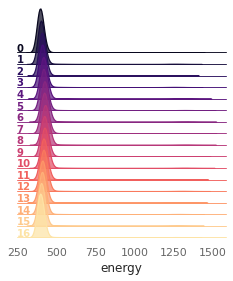

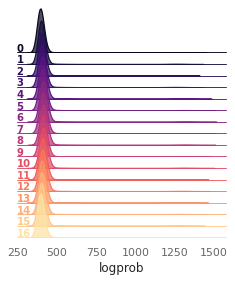

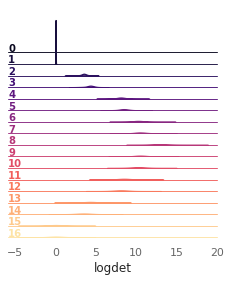

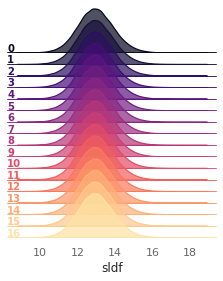

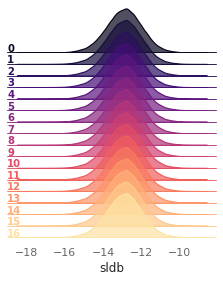

...

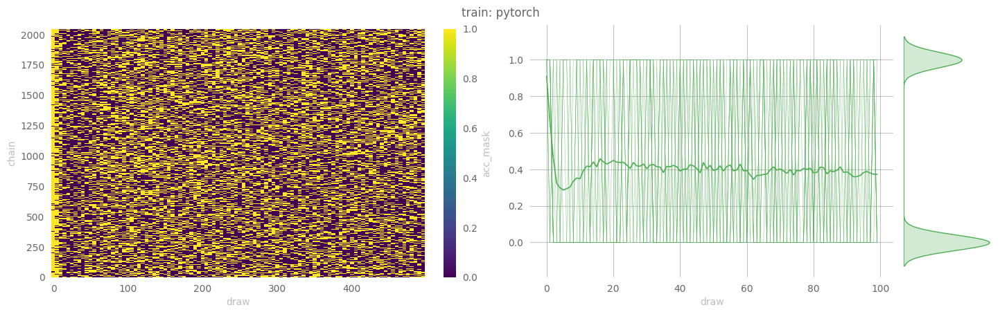

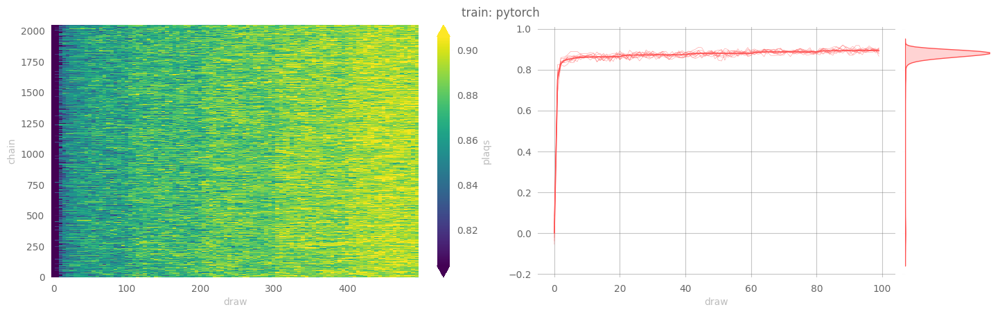

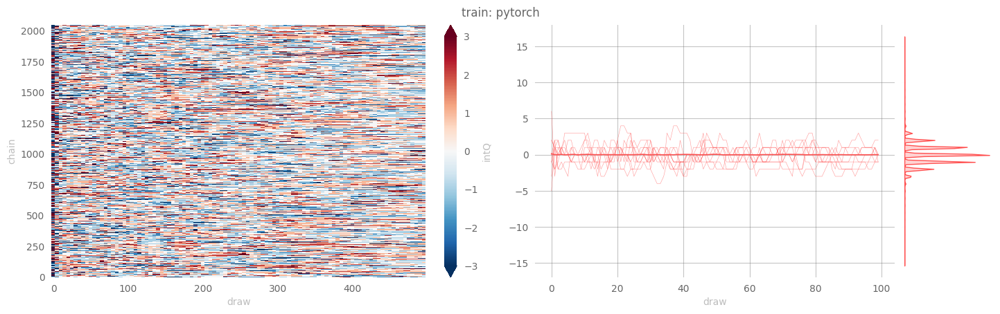

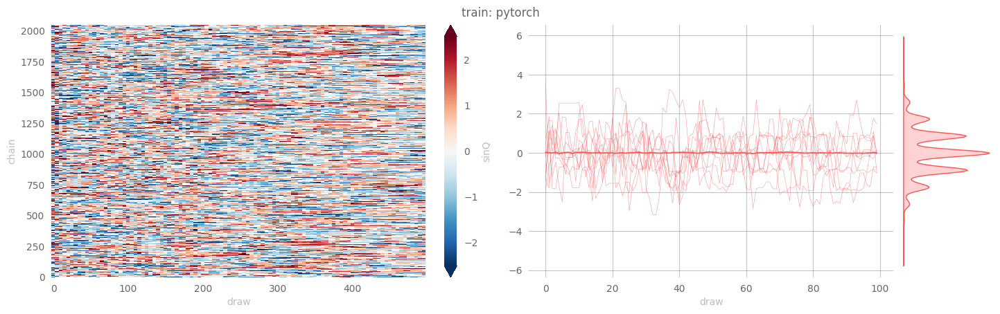

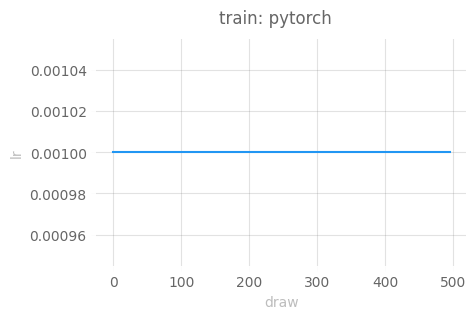

In [11]:
import warnings
import seaborn as sns

warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['pytorch']['train'] = ptExpU1.train()

22:18:27 WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=41512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=290228;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=694562;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=845689;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         INFO     eps=None                                                                                ]8;id=42157;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=284867;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#676\676]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7f35144c0b50>                                                     
                  nprint=100                                                                                            
                  eval_steps=1000                                                                                       
                  nleapfrog=None                                                                                        

  0%|          | 0/1000 [00:00<?, ?it/s]

         INFO     estep=0   dt=0.4735 beta=5.0000 loss=-443.6888 dQsin=1.5757 dQint=3.5625                ]8;id=162078;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=888762;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  energy=1568.1924 logprob=1562.3365 logdet=5.8558 sldf=13.0307 sldb=-13.0713 sld=5.8558                
                  xeps=0.2405 veps=0.1776 acc=0.8055 sumlogdet=-0.1419 acc_mask=0.8047 plaqs=-0.0041                    
                  intQ=0.1797 sinQ=-0.0326                                                                              

22:18:42 INFO     estep=100 dt=0.1390 beta=5.0000 loss=3.2798 dQsin=0.1070 dQint=0.0859 energy=408.2398   ]8;id=162058;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=817019;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=402.4590 logdet=5.7807 sldf=12.7049 sldb=-12.8044 sld=5.7807 xeps=0.2405                      
                  veps=0.1776 acc=0.3392 sumlogdet=-0.0219 acc_mask=0.3438 plaqs=0.8934 intQ=-0.0859                    
                  sinQ=-0.0798                                                                                          

22:18:57 INFO     estep=200 dt=0.1417 beta=5.0000 loss=-7.8636 dQsin=0.1761 dQint=0.1563 energy=412.2973  ]8;id=874396;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=487065;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=406.4543 logdet=5.8431 sldf=12.7033 sldb=-12.5683 sld=5.8431 xeps=0.2405                      
                  veps=0.1776 acc=0.3647 sumlogdet=0.0534 acc_mask=0.3906 plaqs=0.8922 intQ=0.0313                      
                  sinQ=0.0366                                                                                           

22:19:12 INFO     estep=300 dt=0.1423 beta=5.0000 loss=5.3200 dQsin=0.1438 dQint=0.1016 energy=408.9057   ]8;id=43057;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=590459;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=403.0514 logdet=5.8544 sldf=12.8042 sldb=-12.7484 sld=5.8544 xeps=0.2405                      
                  veps=0.1776 acc=0.4741 sumlogdet=0.0039 acc_mask=0.4609 plaqs=0.8946 intQ=0.0625                      
                  sinQ=0.0663                                                                                           

22:19:27 INFO     estep=400 dt=0.1430 beta=5.0000 loss=5.6139 dQsin=0.1245 dQint=0.0938 energy=410.4647   ]8;id=404942;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=801383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=404.6339 logdet=5.8308 sldf=12.8089 sldb=-12.7181 sld=5.8308 xeps=0.2405                      
                  veps=0.1776 acc=0.3480 sumlogdet=0.0860 acc_mask=0.3516 plaqs=0.8933 intQ=-0.1484                     
                  sinQ=-0.1469                                                                                          

22:19:42 INFO     estep=500 dt=0.1434 beta=5.0000 loss=0.3343 dQsin=0.1315 dQint=0.0859 energy=411.3779   ]8;id=366574;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=519943;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=405.5104 logdet=5.8676 sldf=12.7991 sldb=-12.6580 sld=5.8676 xeps=0.2405                      
                  veps=0.1776 acc=0.3833 sumlogdet=-0.0155 acc_mask=0.3984 plaqs=0.8922 intQ=-0.0781                    
                  sinQ=-0.0737                                                                                          

22:19:58 INFO     estep=600 dt=0.1465 beta=5.0000 loss=3.5428 dQsin=0.0549 dQint=0.0234 energy=412.1877   ]8;id=358306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=611173;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=406.3560 logdet=5.8318 sldf=12.7996 sldb=-12.6751 sld=5.8318 xeps=0.2405                      
                  veps=0.1776 acc=0.3680 sumlogdet=0.0402 acc_mask=0.3047 plaqs=0.8930 intQ=0.0391                      
                  sinQ=0.0321                                                                                           

22:20:13 INFO     estep=700 dt=0.1465 beta=5.0000 loss=6.0777 dQsin=0.1323 dQint=0.0938 energy=415.0865   ]8;id=856123;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=490858;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=409.2397 logdet=5.8469 sldf=12.6520 sldb=-12.4891 sld=5.8469 xeps=0.2405                      
                  veps=0.1776 acc=0.3758 sumlogdet=0.0032 acc_mask=0.4062 plaqs=0.8935 intQ=0.0547                      
                  sinQ=0.0682                                                                                           

22:20:29 INFO     estep=800 dt=0.1434 beta=5.0000 loss=1.6662 dQsin=0.1184 dQint=0.0938 energy=413.9817   ]8;id=499053;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=47531;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=408.2743 logdet=5.7074 sldf=12.5311 sldb=-12.6191 sld=5.7074 xeps=0.2405                      
                  veps=0.1776 acc=0.3437 sumlogdet=-0.0743 acc_mask=0.3281 plaqs=0.8934 intQ=0.1016                     
                  sinQ=0.0842                                                                                           

22:20:44 INFO     estep=900 dt=0.1485 beta=5.0000 loss=1.1466 dQsin=0.1184 dQint=0.0859 energy=412.2907   ]8;id=820919;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=978278;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=406.4649 logdet=5.8258 sldf=12.8121 sldb=-12.7763 sld=5.8258 xeps=0.2405                      
                  veps=0.1776 acc=0.3765 sumlogdet=-0.0199 acc_mask=0.3750 plaqs=0.8947 intQ=-0.0859                    
                  sinQ=-0.0671                                                                                          

22:21:03 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=493711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=912458;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/energy_ridgeplot.svg                                                                               

22:21:08 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=857047;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=623814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/logprob_ridgeplot.svg                                                                              

22:21:13 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=924390;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=178227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/logdet_ridgeplot.svg                                                                               

22:21:17 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=460950;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=769178;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/sldf_ridgeplot.svg                                                                                 

22:21:22 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=819004;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=544433;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/sldb_ridgeplot.svg                                                                                 

22:21:27 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=854318;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=459142;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/plots/ridgeplo                    
                  ts/sld_ridgeplot.svg                                                                                  

22:21:38 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=310041;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=288401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/eval/data/eval_data.h5                      

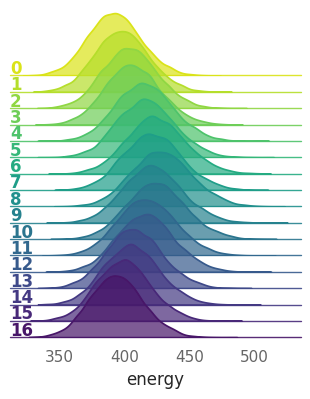

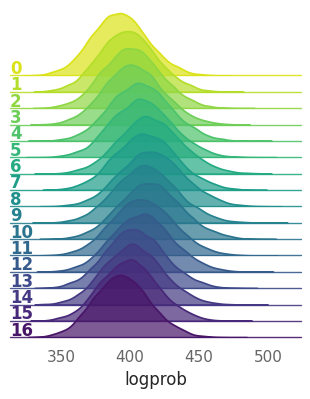

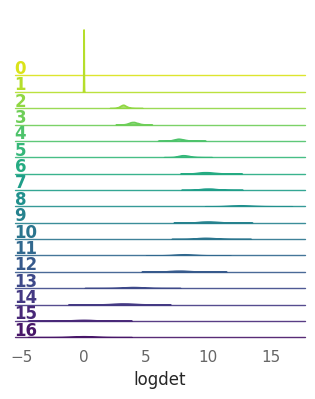

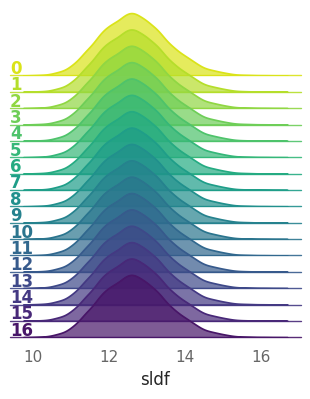

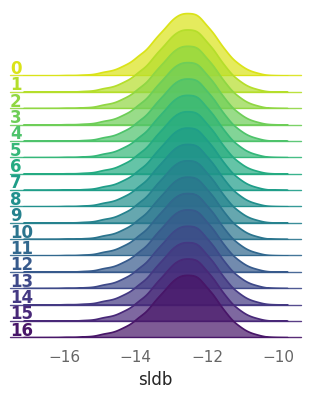

...

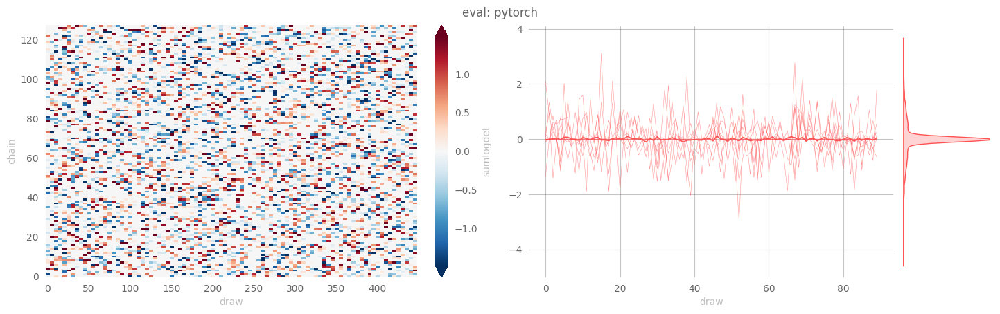

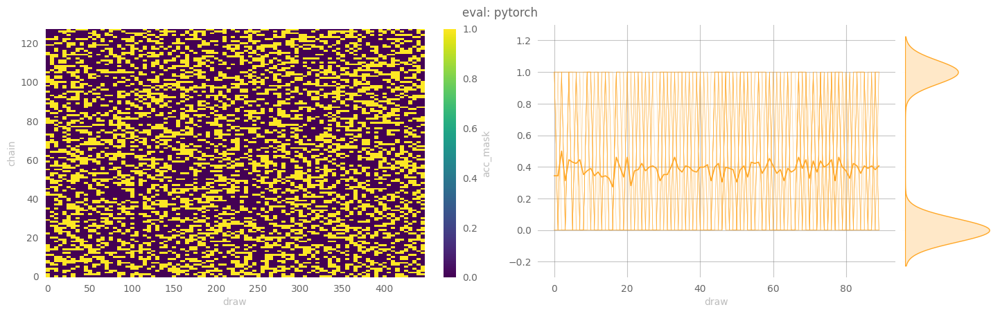

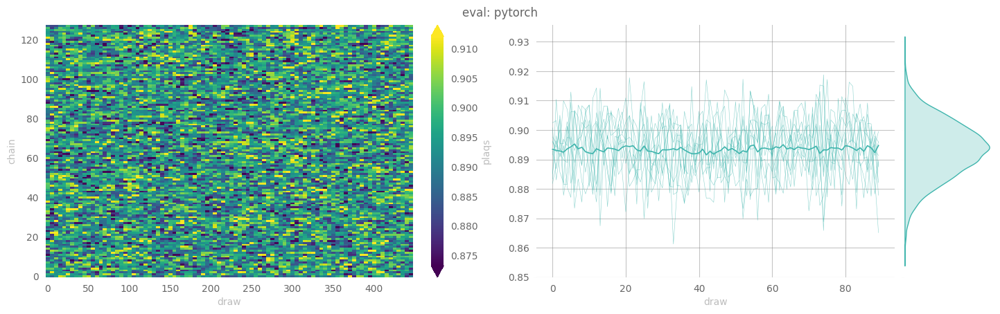

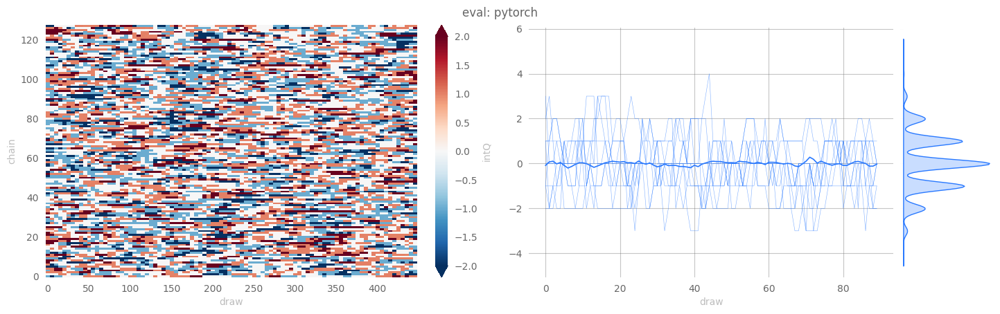

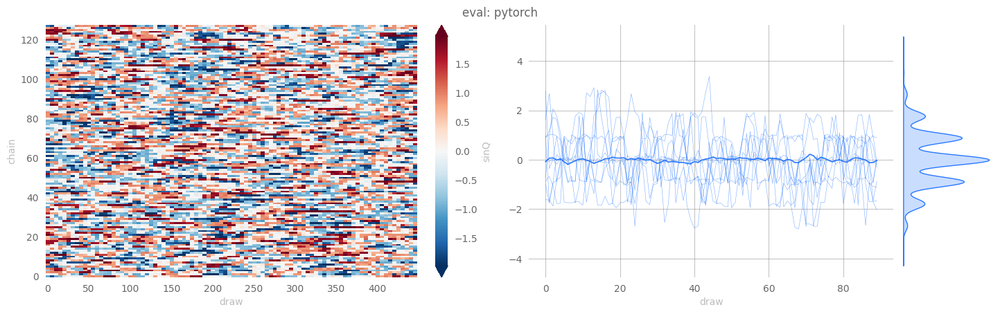

In [12]:
outputs['pytorch']['eval'] = ptExpU1.evaluate(
    job_type='eval',
    nchains=128,
    eval_steps=1000,
    nprint=100,
    nlog=10,
)

23:13:47 WARNING  Using step size eps: 0.1250 for generic HMC                                             ]8;id=129894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=194638;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#631\631]8;;\

23:13:48 WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=436548;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=457241;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=806420;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=125270;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         INFO     eps=0.125                                                                               ]8;id=984713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=555534;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#676\676]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7f23411222e0>                                                     
                  nprint=100                                                                                            
                  eval_steps=1000                                                                                       
                  nleapfrog=16                                                                                          

  0%|          | 0/1000 [00:00<?, ?it/s]

23:13:49 INFO     hstep=0   dt=0.6438 beta=5.0000 loss=-651.5536 dQsin=2.0269 dQint=4.7734                ]8;id=108100;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=869711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  energy=1522.8817 logprob=1522.8817 logdet=0.0000 acc=1.0000 sumlogdet=0.0000                          
                  acc_mask=1.0000 plaqs=-0.0015 intQ=0.3516 sinQ=0.1737                                                 

23:13:52 INFO     hstep=100 dt=0.0290 beta=5.0000 loss=6.5139 dQsin=0.1051 dQint=0.0156 energy=396.8875   ]8;id=881401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=508770;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=396.8875 logdet=0.0000 acc=0.6178 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8914               
                  intQ=0.1719 sinQ=0.1386                                                                               

23:13:55 INFO     hstep=200 dt=0.0286 beta=5.0000 loss=4.3957 dQsin=0.1122 dQint=0.0156 energy=393.7154   ]8;id=395124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=857456;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=393.7154 logdet=0.0000 acc=0.6023 sumlogdet=0.0000 acc_mask=0.6094 plaqs=0.8921               
                  intQ=0.1797 sinQ=0.1542                                                                               

23:13:58 INFO     hstep=300 dt=0.0285 beta=5.0000 loss=3.9924 dQsin=0.1202 dQint=0.0234 energy=393.6230   ]8;id=856439;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=688276;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=393.6230 logdet=0.0000 acc=0.6722 sumlogdet=0.0000 acc_mask=0.6484 plaqs=0.8924               
                  intQ=-0.1172 sinQ=-0.0783                                                                             

23:14:01 INFO     hstep=400 dt=0.0286 beta=5.0000 loss=5.2151 dQsin=0.1131 dQint=0.0313 energy=394.0275   ]8;id=267884;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=672182;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=394.0275 logdet=0.0000 acc=0.6288 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8936               
                  intQ=-0.0156 sinQ=-0.0036                                                                             

23:14:04 INFO     hstep=500 dt=0.0241 beta=5.0000 loss=5.7676 dQsin=0.0835 dQint=0.0156 energy=395.2712   ]8;id=200711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=362124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=395.2712 logdet=0.0000 acc=0.5173 sumlogdet=0.0000 acc_mask=0.5000 plaqs=0.8939               
                  intQ=-0.0937 sinQ=-0.0810                                                                             

23:14:07 INFO     hstep=600 dt=0.0242 beta=5.0000 loss=9.3410 dQsin=0.0993 dQint=0.0156 energy=392.3118   ]8;id=113411;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=736791;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=392.3118 logdet=0.0000 acc=0.6390 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8927               
                  intQ=0.1172 sinQ=0.0901                                                                               

23:14:09 INFO     hstep=700 dt=0.0270 beta=5.0000 loss=6.2393 dQsin=0.1085 dQint=0.0156 energy=391.5356   ]8;id=734143;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=849284;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=391.5356 logdet=0.0000 acc=0.6542 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8936               
                  intQ=0.1094 sinQ=0.0839                                                                               

23:14:12 INFO     hstep=800 dt=0.0242 beta=5.0000 loss=8.4002 dQsin=0.1004 dQint=0.0313 energy=389.9739   ]8;id=164804;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=608608;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=389.9739 logdet=0.0000 acc=0.6429 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8929               
                  intQ=0.0391 sinQ=0.0309                                                                               

23:14:15 INFO     hstep=900 dt=0.0241 beta=5.0000 loss=7.9392 dQsin=0.1064 dQint=0.0078 energy=391.5505   ]8;id=952097;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=988809;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#792\792]8;;\
                  logprob=391.5505 logdet=0.0000 acc=0.6411 sumlogdet=0.0000 acc_mask=0.6328 plaqs=0.8940               
                  intQ=-0.1094 sinQ=-0.0782                                                                             

23:14:21 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=282413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=162368;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/hmc/plots/ridgeplot                    
                  s/energy_ridgeplot.svg                                                                                

23:14:26 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=889115;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=881306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/hmc/plots/ridgeplot                    
                  s/logprob_ridgeplot.svg                                                                               

23:14:30 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=755108;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=339203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/hmc/plots/ridgeplot                    
                  s/logdet_ridgeplot.svg                                                                                

23:14:40 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=832110;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=825218;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-05-212354/pytorch/hmc/data/hmc_data.h5                        

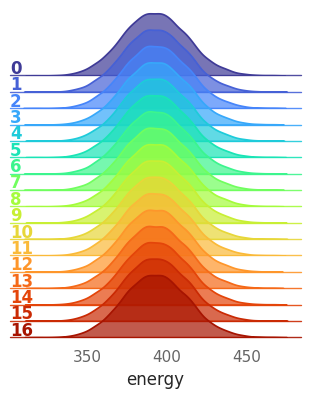

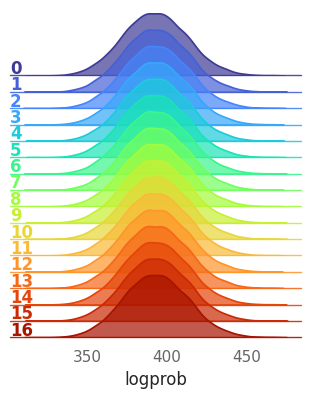

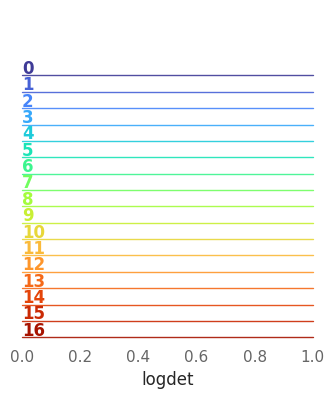

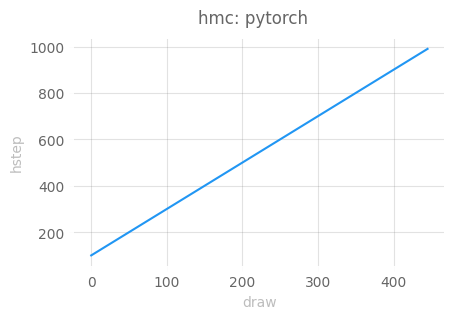

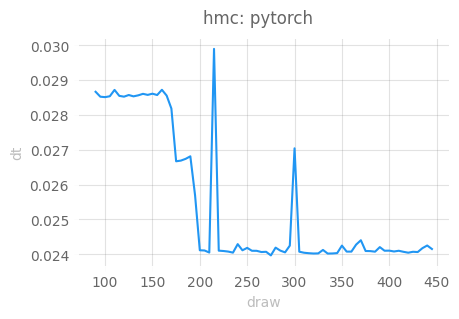

...

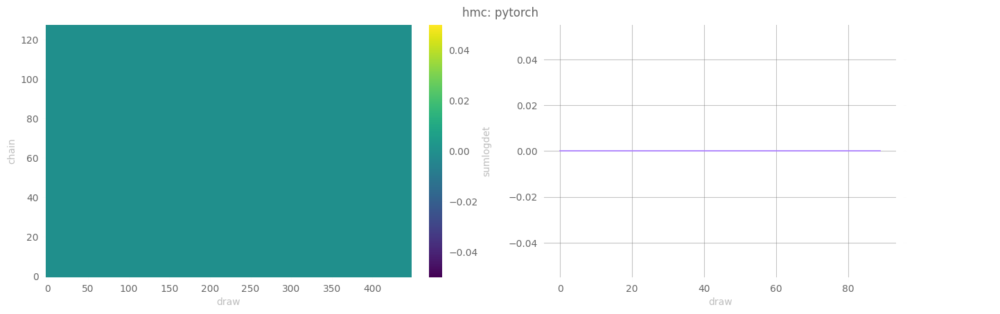

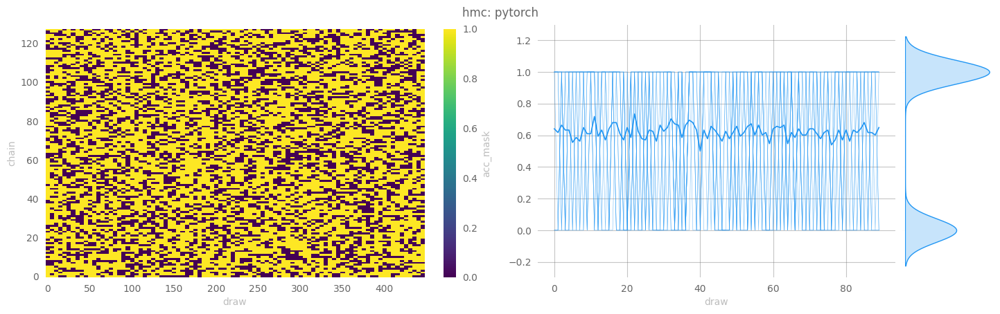

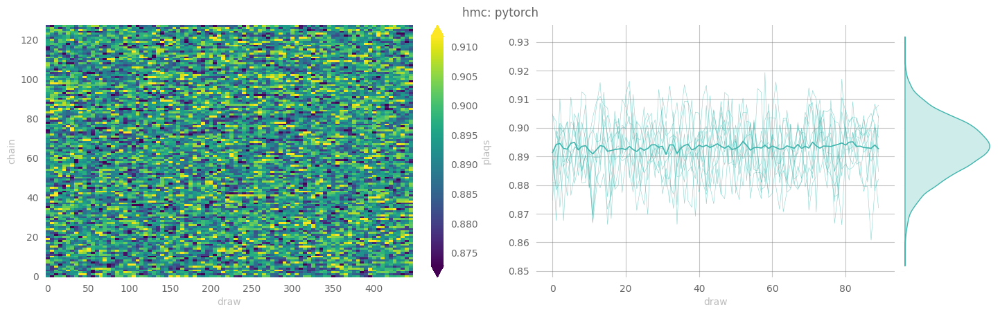

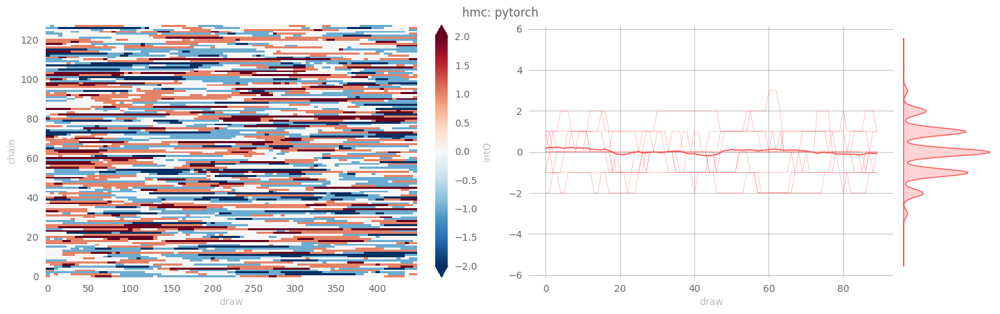

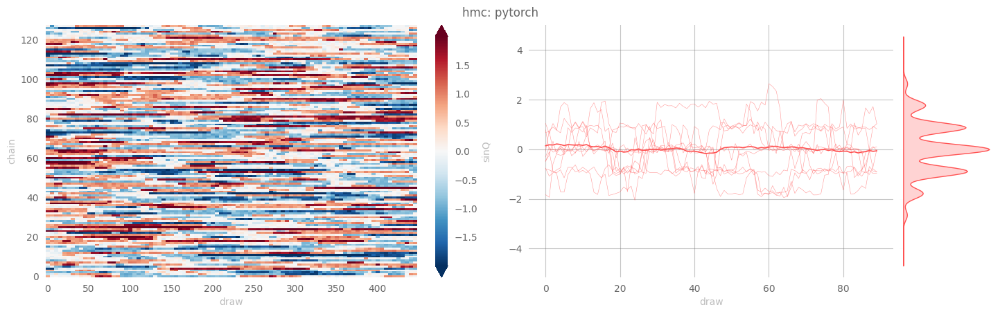

In [13]:
outputs['pytorch']['hmc'] = ptExpU1.evaluate(
    job_type='hmc',
    nchains=128,
    eval_steps=1000,
    nprint=100,
    nlog=10,
)

# TensorFlow

23:14:56 INFO     Looking for checkpoints in: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/proje ]8;id=755692;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=82304;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#245\245]8;;\
                  cts/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-Tru               
                  e/4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                    

         WARNING  Restored checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/project ]8;id=414442;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=50054;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#255\255]8;;\
                  s/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/               
                  4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow/ckpt-4                               

─────────────────────────────────────────────── ERA: 0 / 5, BETA: 4.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

23:16:25 INFO     era=0   epoch=0   train_step=3000.0000 dt=84.4195 beta=4.0000 loss=-126.9514            ]8;id=937984;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=842428;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQsin=0.4813 dQint=1.1060 energy=1292.7369 logprob=1292.7330 logdet=0.0038 sldf=0.0071                
                  sldb=-0.0033 sld=0.0038 xeps=0.2017 veps=0.1667 acc=0.2235 sumlogdet=0.0003                           
                  acc_mask=0.2256 plaqs=0.0003 intQ=0.1138 sinQ=0.0137 tstep=3000.0000 lr=0.0010                        

23:17:26 INFO     era=0   epoch=50  train_step=3050.0000 dt=0.4135 beta=4.0000 loss=-15.3325 dQsin=0.2105 ]8;id=39840;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=230048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1968 energy=407.2190 logprob=407.2110 logdet=0.0079 sldf=0.0127 sldb=-0.0048                  
                  sld=0.0079 xeps=0.2074 veps=0.1641 acc=0.3594 sumlogdet=-0.0002 acc_mask=0.3589                       
                  plaqs=0.8574 intQ=0.0161 sinQ=0.0190 tstep=3050.0000 lr=0.0010                                        

23:18:22 INFO     Saving took: 0.000699043s                                                              ]8;id=531329;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=91926;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1026\1026]8;;\

         INFO     Era 0 took: 205.506s                                                                   ]8;id=831306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=984580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1027\1027]8;;\

─────────────────────────────────────────────── ERA: 1 / 5, BETA: 4.250 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

23:18:26 INFO     era=1   epoch=0   train_step=3100.0000 dt=0.3908 beta=4.2500 loss=-24.1051 dQsin=0.3064 ]8;id=733360;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=332383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.2744 energy=411.3079 logprob=411.3033 logdet=0.0047 sldf=0.0101 sldb=-0.0054                  
                  sld=0.0047 xeps=0.2081 veps=0.1639 acc=0.5481 sumlogdet=-0.0018 acc_mask=0.5688                       
                  plaqs=0.8635 intQ=0.0132 sinQ=0.0120 tstep=3100.0000 lr=0.0010                                        

23:19:26 INFO     era=1   epoch=50  train_step=3150.0000 dt=0.4019 beta=4.2500 loss=-16.0886 dQsin=0.2298 ]8;id=320470;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=990957;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1904 energy=401.6191 logprob=401.6189 logdet=0.0003 sldf=0.0023 sldb=-0.0020                  
                  sld=0.0003 xeps=0.2087 veps=0.1626 acc=0.5053 sumlogdet=-0.0004 acc_mask=0.5063                       
                  plaqs=0.8725 intQ=0.0386 sinQ=0.0357 tstep=3150.0000 lr=0.0010                                        

23:20:22 INFO     Saving took: 0.000368595s                                                              ]8;id=483219;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=69444;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1026\1026]8;;\

         INFO     Era 1 took: 120.27s                                                                    ]8;id=613395;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=269933;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1027\1027]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=898112;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=722293;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#991\991]8;;\
                   train_step=3147.5000, dt=0.3983, beta=4.2500, loss=-15.7662, dQsin=0.2316,                           
                  dQint=0.1939, energy=402.2677, logprob=402.2665, logdet=0.0011, sldf=0.0042,                          
                  sldb=-0.0031, sld=0.0011, xeps=0.2085, veps=0.1631, acc=0.5050, sumlogdet=-0.0003,                    
                  acc_mask=0.5051, plaqs=0.8717, intQ=0.0309, sinQ=0.0258, tstep=3147.5000, lr=0.0010                   
                                                                                                                        

─────────────────────────────────────────────── ERA: 2 / 5, BETA: 4.500 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

23:20:26 INFO     era=2   epoch=0   train_step=3200.0000 dt=0.3913 beta=4.5000 loss=-14.4942 dQsin=0.2248 ]8;id=447012;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=995628;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1812 energy=409.5372 logprob=409.5376 logdet=-0.0004 sldf=0.0014 sldb=-0.0018                 
                  sld=-0.0004 xeps=0.2085 veps=0.1635 acc=0.5305 sumlogdet=0.0006 acc_mask=0.5278                       
                  plaqs=0.8726 intQ=0.0156 sinQ=0.0148 tstep=3200.0000 lr=0.0010                                        

23:21:26 INFO     era=2   epoch=50  train_step=3250.0000 dt=0.4193 beta=4.5000 loss=-9.0068 dQsin=0.2018  ]8;id=211704;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=106213;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1499 energy=401.0472 logprob=401.0477 logdet=-0.0005 sldf=0.0007 sldb=-0.0012                 
                  sld=-0.0005 xeps=0.2082 veps=0.1643 acc=0.5516 sumlogdet=-0.0011 acc_mask=0.5459                      
                  plaqs=0.8802 intQ=-0.0205 sinQ=-0.0220 tstep=3250.0000 lr=0.0010                                      

23:22:21 INFO     Saving took: 0.00057292s                                                               ]8;id=415914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=204055;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1026\1026]8;;\

         INFO     Era 2 took: 119.557s                                                                   ]8;id=739099;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=929506;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1027\1027]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=930457;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=481894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#991\991]8;;\
                   train_step=3247.5000, dt=0.4037, beta=4.5000, loss=-8.2873, dQsin=0.1914,                            
                  dQint=0.1423, energy=401.2698, logprob=401.2697, logdet=0.0001, sldf=0.0014,                          
                  sldb=-0.0013, sld=0.0001, xeps=0.2081, veps=0.1644, acc=0.5146, sumlogdet=-0.0000,                    
                  acc_mask=0.5164, plaqs=0.8797, intQ=-0.0274, sinQ=-0.0239, tstep=3247.5000, lr=0.0010                 
                                                                                                                        

─────────────────────────────────────────────── ERA: 3 / 5, BETA: 4.750 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

23:22:26 INFO     era=3   epoch=0   train_step=3300.0000 dt=0.3991 beta=4.7500 loss=-2.0580 dQsin=0.1425  ]8;id=524830;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=247807;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1011 energy=408.4714 logprob=408.4714 logdet=-0.0000 sldf=0.0016 sldb=-0.0017                 
                  sld=-0.0000 xeps=0.2083 veps=0.1639 acc=0.4419 sumlogdet=-0.0005 acc_mask=0.4243                      
                  plaqs=0.8806 intQ=0.0234 sinQ=0.0211 tstep=3300.0000 lr=0.0010                                        

23:23:26 INFO     era=3   epoch=50  train_step=3350.0000 dt=0.3896 beta=4.7500 loss=-2.2333 dQsin=0.1595  ]8;id=858292;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=836294;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.1040 energy=400.5761 logprob=400.5775 logdet=-0.0015 sldf=0.0003 sldb=-0.0018                 
                  sld=-0.0015 xeps=0.2093 veps=0.1629 acc=0.5341 sumlogdet=-0.0007 acc_mask=0.5361                      
                  plaqs=0.8871 intQ=-0.0229 sinQ=-0.0134 tstep=3350.0000 lr=0.0010                                      

23:24:21 INFO     Saving took: 0.000427246s                                                              ]8;id=378802;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=976250;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1026\1026]8;;\

         INFO     Era 3 took: 119.119s                                                                   ]8;id=900397;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=215042;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1027\1027]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=540052;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=932891;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#991\991]8;;\
                   train_step=3347.5000, dt=0.4009, beta=4.7500, loss=-2.8279, dQsin=0.1586,                            
                  dQint=0.1061, energy=401.6089, logprob=401.6090, logdet=-0.0002, sldf=0.0014,                         
                  sldb=-0.0016, sld=-0.0002, xeps=0.2094, veps=0.1629, acc=0.5056, sumlogdet=-0.0001,                   
                  acc_mask=0.5060, plaqs=0.8865, intQ=-0.0257, sinQ=-0.0215, tstep=3347.5000, lr=0.0010                 
                                                                                                                        

─────────────────────────────────────────────── ERA: 4 / 5, BETA: 5.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

23:24:25 INFO     era=4   epoch=0   train_step=3400.0000 dt=0.4067 beta=5.0000 loss=-1.6009 dQsin=0.1549  ]8;id=736536;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=441632;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.0977 energy=408.2121 logprob=408.2122 logdet=-0.0001 sldf=0.0013 sldb=-0.0014                 
                  sld=-0.0001 xeps=0.2096 veps=0.1628 acc=0.5307 sumlogdet=-0.0000 acc_mask=0.5356                      
                  plaqs=0.8875 intQ=-0.0518 sinQ=-0.0460 tstep=3400.0000 lr=0.0010                                      

23:25:24 INFO     era=4   epoch=50  train_step=3450.0000 dt=0.4083 beta=5.0000 loss=2.0027 dQsin=0.1311   ]8;id=183175;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=998815;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#848\848]8;;\
                  dQint=0.0679 energy=400.9055 logprob=400.9057 logdet=-0.0002 sldf=0.0016 sldb=-0.0018                 
                  sld=-0.0002 xeps=0.2092 veps=0.1627 acc=0.5361 sumlogdet=-0.0017 acc_mask=0.5366                      
                  plaqs=0.8936 intQ=-0.0010 sinQ=-0.0028 tstep=3450.0000 lr=0.0010                                      

23:26:20 INFO     Saving took: 0.818361s                                                                 ]8;id=612905;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=213133;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1026\1026]8;;\

         INFO     Era 4 took: 119.709s                                                                   ]8;id=316436;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=63240;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1027\1027]8;;\

23:27:09 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=852336;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=369608;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/energy_ridgeplot.svg                                                                           

23:27:59 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=560296;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=160495;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/logprob_ridgeplot.svg                                                                          

23:28:51 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=523855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=950492;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/logdet_ridgeplot.svg                                                                           

23:29:42 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=810890;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=997075;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/sldf_ridgeplot.svg                                                                             

23:30:25 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=575700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=495385;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/sldb_ridgeplot.svg                                                                             

23:31:15 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=349970;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=145467;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/plots/ridg                    
                  eplots/sld_ridgeplot.svg                                                                              

23:31:33 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=137293;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=50407;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/train/data/train_data.h5                 

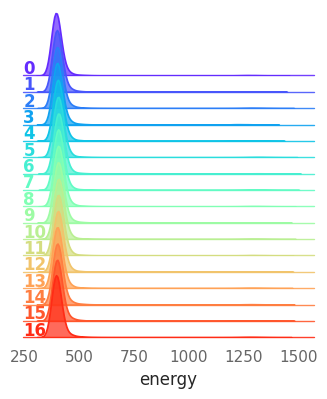

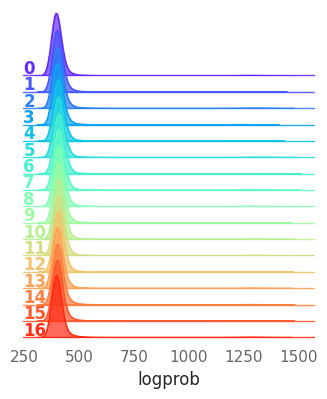

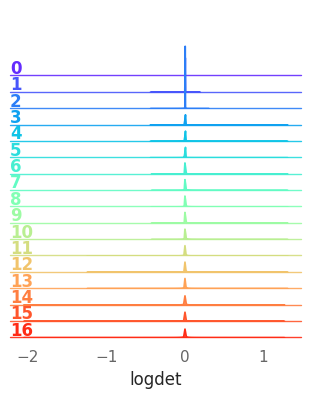

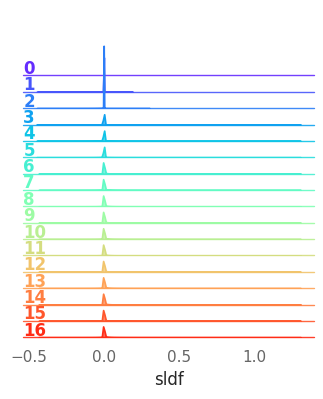

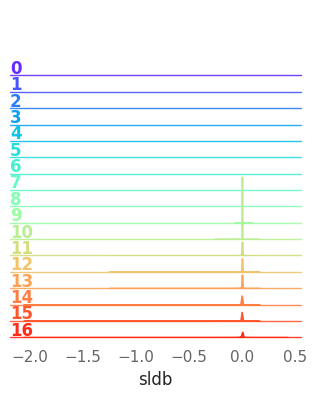

...

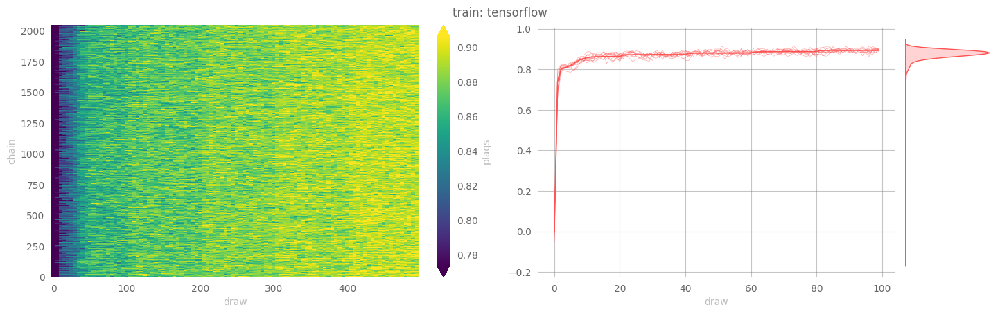

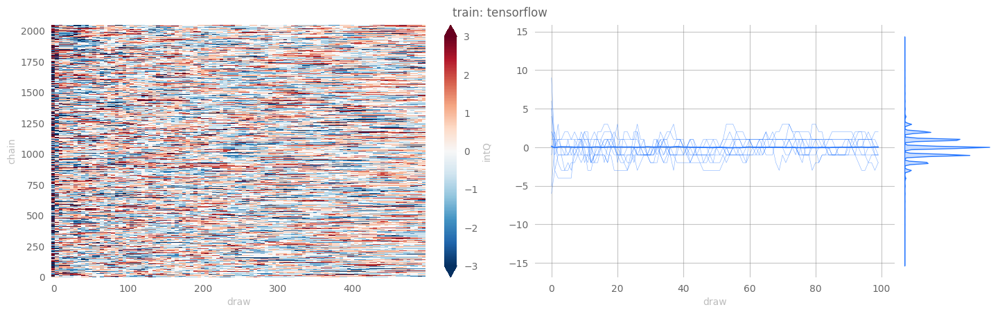

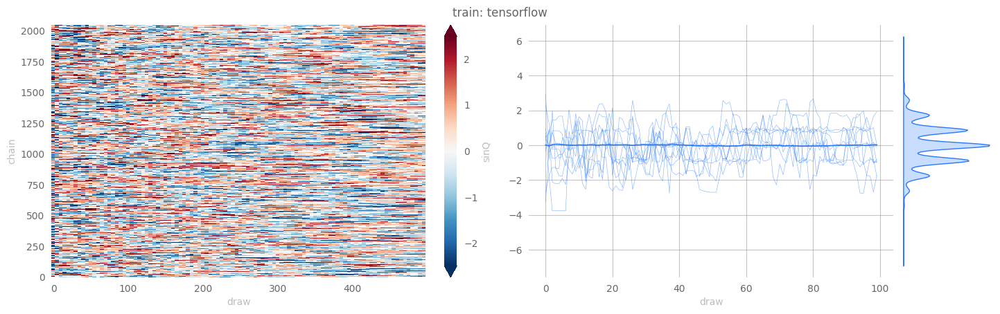

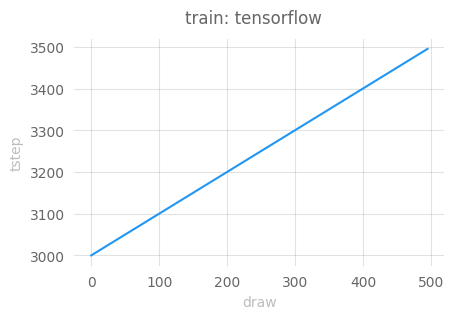

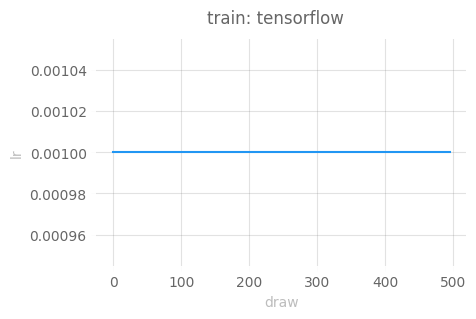

In [14]:
warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train()

23:32:36 WARNING  x.shape (original): (2048, 2, 16, 16)                                                   ]8;id=654841;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=970295;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#516\516]8;;\

         WARNING  x[:nchains].shape: (128, 2, 16, 16)                                                     ]8;id=151968;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=572590;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#522\522]8;;\

         INFO     eps = None                                                                              ]8;id=73137;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=341086;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#554\554]8;;\
                  beta = 5.0                                                                                            
                  nlog = 10                                                                                             
                  table = <rich.table.Table object at 0x7f2c541ab100>                                                   
                  nprint = 100                                                                                          
                  eval_steps = 1000                                                                                     
                  nleapfrog = None                                                                                      

  0%|          | 0/1000 [00:00<?, ?it/s]

23:32:50 INFO     estep=0   dt=13.0576 beta=5.0000 loss=-550.6603 dQsin=1.8140 dQint=4.3203               ]8;id=179331;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=700700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  energy=1533.9451 logprob=1533.9421 logdet=0.0030 sldf=0.0072 sldb=-0.0041 sld=0.0030                  
                  xeps=0.2091 veps=0.1626 acc=0.9871 sumlogdet=-0.0026 acc_mask=0.9844 plaqs=-0.0001                    
                  intQ=-0.0000 sinQ=0.0481                                                                              

23:33:06 INFO     estep=100 dt=0.0555 beta=5.0000 loss=3.7608 dQsin=0.1206 dQint=0.0625 energy=401.5724   ]8;id=707471;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=63779;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=401.5670 logdet=0.0053 sldf=0.0063 sldb=-0.0010 sld=0.0053 xeps=0.2091                        
                  veps=0.1626 acc=0.5450 sumlogdet=0.0050 acc_mask=0.5000 plaqs=0.8924 intQ=0.1172                      
                  sinQ=0.1057                                                                                           

23:33:13 INFO     estep=200 dt=0.0586 beta=5.0000 loss=2.8616 dQsin=0.1104 dQint=0.0547 energy=404.5452   ]8;id=669285;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=91876;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=404.5439 logdet=0.0012 sldf=0.0016 sldb=-0.0003 sld=0.0012 xeps=0.2091                        
                  veps=0.1626 acc=0.5057 sumlogdet=0.0007 acc_mask=0.5312 plaqs=0.8929 intQ=0.1250                      
                  sinQ=0.0935                                                                                           

23:33:19 INFO     estep=300 dt=0.0557 beta=5.0000 loss=1.9730 dQsin=0.1287 dQint=0.0781 energy=399.0090   ]8;id=794724;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=830580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=399.0062 logdet=0.0027 sldf=0.0043 sldb=-0.0015 sld=0.0027 xeps=0.2091                        
                  veps=0.1626 acc=0.4580 sumlogdet=0.0007 acc_mask=0.4375 plaqs=0.8947 intQ=-0.0469                     
                  sinQ=-0.0399                                                                                          

23:33:25 INFO     estep=400 dt=0.0561 beta=5.0000 loss=1.1809 dQsin=0.1807 dQint=0.1406 energy=397.9593   ]8;id=155476;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=960003;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=397.9574 logdet=0.0019 sldf=0.0030 sldb=-0.0011 sld=0.0019 xeps=0.2091                        
                  veps=0.1626 acc=0.5059 sumlogdet=-0.0010 acc_mask=0.5078 plaqs=0.8934 intQ=0.2734                     
                  sinQ=0.2283                                                                                           

23:33:32 INFO     estep=500 dt=0.0559 beta=5.0000 loss=3.5614 dQsin=0.1368 dQint=0.0938 energy=402.5675   ]8;id=227576;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=41850;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=402.5654 logdet=0.0021 sldf=0.0027 sldb=-0.0006 sld=0.0021 xeps=0.2091                        
                  veps=0.1626 acc=0.5105 sumlogdet=-0.0009 acc_mask=0.4766 plaqs=0.8932 intQ=-0.1172                    
                  sinQ=-0.1051                                                                                          

23:33:38 INFO     estep=600 dt=0.0559 beta=5.0000 loss=2.9838 dQsin=0.1204 dQint=0.0625 energy=399.2077   ]8;id=453794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=410455;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=399.2077 logdet=0.0000 sldf=0.0019 sldb=-0.0019 sld=0.0000 xeps=0.2091                        
                  veps=0.1626 acc=0.6015 sumlogdet=-0.0026 acc_mask=0.6016 plaqs=0.8937 intQ=0.0078                     
                  sinQ=0.0201                                                                                           

23:33:44 INFO     estep=700 dt=0.0555 beta=5.0000 loss=1.1221 dQsin=0.1401 dQint=0.0625 energy=398.1275   ]8;id=772512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=340169;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=398.1268 logdet=0.0007 sldf=0.0012 sldb=-0.0005 sld=0.0007 xeps=0.2091                        
                  veps=0.1626 acc=0.5497 sumlogdet=0.0007 acc_mask=0.5156 plaqs=0.8946 intQ=0.0625                      
                  sinQ=0.0583                                                                                           

23:33:50 INFO     estep=800 dt=0.0558 beta=5.0000 loss=1.2502 dQsin=0.1534 dQint=0.1016 energy=400.7297   ]8;id=217180;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=862807;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=400.7287 logdet=0.0009 sldf=0.0022 sldb=-0.0012 sld=0.0009 xeps=0.2091                        
                  veps=0.1626 acc=0.5259 sumlogdet=0.0002 acc_mask=0.5078 plaqs=0.8938 intQ=-0.0312                     
                  sinQ=-0.0300                                                                                          

23:33:57 INFO     estep=900 dt=0.0807 beta=5.0000 loss=3.9335 dQsin=0.1473 dQint=0.0781 energy=397.9831   ]8;id=707484;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=399718;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#682\682]8;;\
                  logprob=397.9835 logdet=-0.0005 sldf=0.0024 sldb=-0.0028 sld=-0.0005 xeps=0.2091                      
                  veps=0.1626 acc=0.4989 sumlogdet=-0.0033 acc_mask=0.5234 plaqs=0.8950 intQ=0.0234                     
                  sinQ=0.0078                                                                                           

23:34:07 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=981874;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=916755;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/energy_ridgeplot.svg                                                                            

23:34:11 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=959679;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=293651;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/logprob_ridgeplot.svg                                                                           

23:34:16 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=563596;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=662537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/logdet_ridgeplot.svg                                                                            

23:34:21 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=965809;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=319327;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/sldf_ridgeplot.svg                                                                              

23:34:26 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=442537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=334446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/sldb_ridgeplot.svg                                                                              

23:34:31 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=718557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=605814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/plots/ridge                    
                  plots/sld_ridgeplot.svg                                                                               

23:34:43 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=888048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=158772;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-05-212414/tensorflow/eval/data/eval_data.h5                   

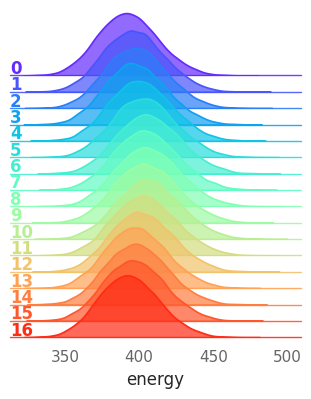

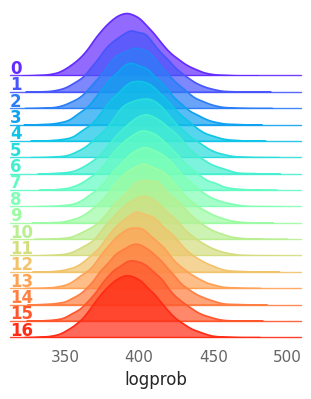

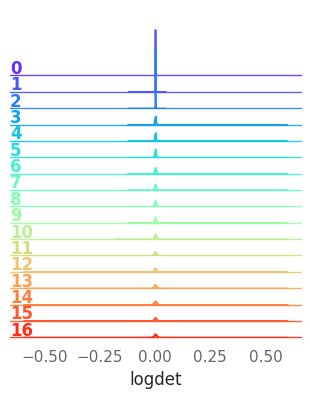

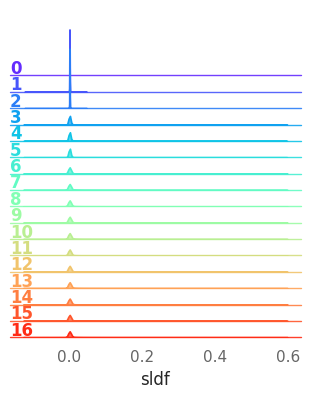

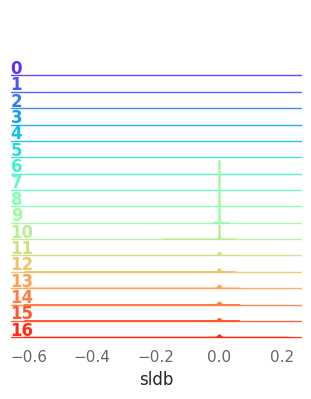

...

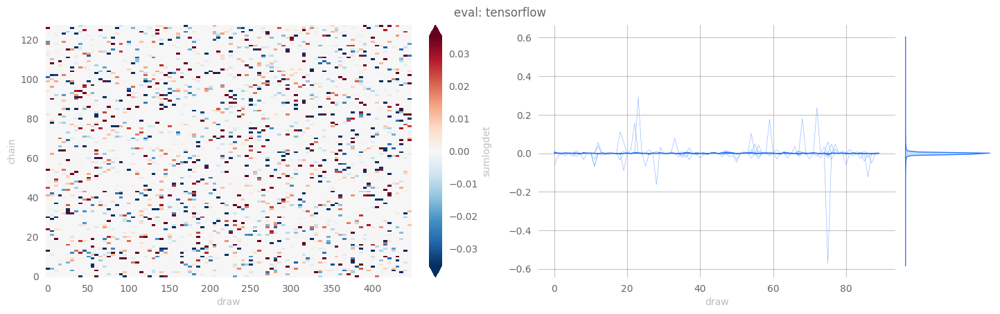

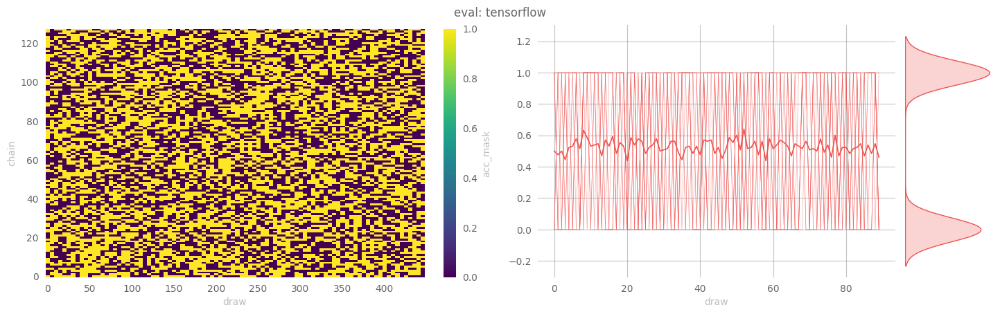

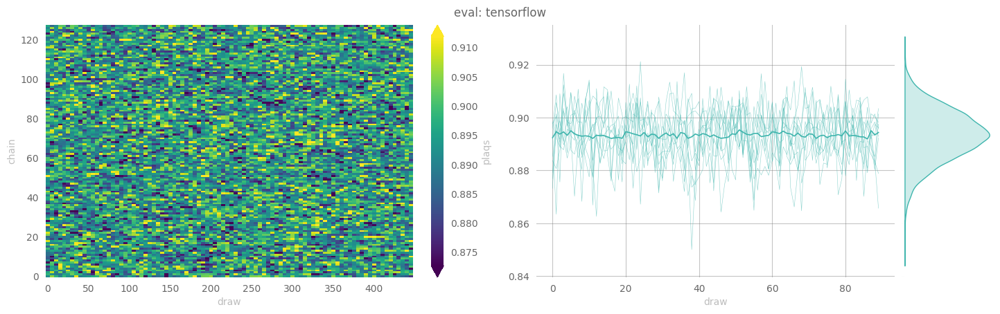

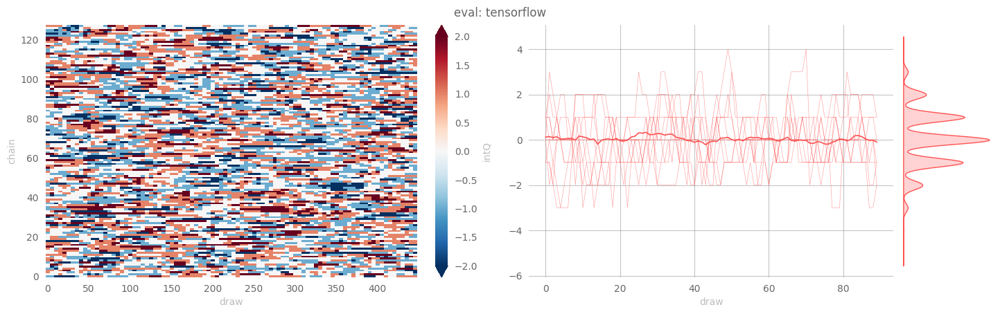

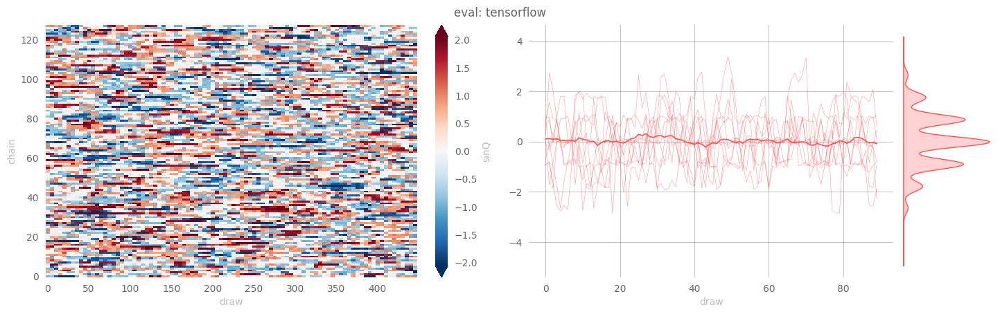

In [15]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(
    job_type='eval',
    nchains=128,
    eval_steps=1000,
    nprint=100,
    nlog=10,
)

In [ ]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(
    job_type='hmc',
    nchains=128,
    eval_steps=1000,
    nprint=100,
    nlog=10,
)

# Model Performance

Our goal is improving the efficiency of our MCMC sampler.

In particular, we are interested in generating **independent** configurations which we can then use to calculate expectation values of physical observables.

For our purposes, we are interested in obtaining lattice configurations from distinct _topological charge sectors_, as characterized by a configurations _topological charge_, $Q$.

Explicitly, HMC is known to suffer from _critical slowing down_, a phenomenon in which our configurations remains stuck in some local topological charge sector and fails to produce distinct configurations.

Because of this, we can assess our models' performance by looking at the _tunneling rate_, i.e. the rate at which our sampler jumps between these different charge sectors.

We can write this quantity as:

$$\delta Q = |Q^{(i)} - Q^{(i-1)}|$$

i.e. look at the difference in the topological charge between sequential configurations.

<div class="alert alert-block alert-info">
<b>Note:</b> 
The efficiency of our sampler is directly proportional to the tunneling rate.
    
Explicitly, this means that the **more efficient** the model $\longrightarrow$
    
- the **larger** tunneling rate
- the **smaller** integrated autocorrelation time for $Q$
</div>

In [ ]:
import xarray as xr

def get_thermalized_configs(x: np.ndarray | xr.DataArray) -> np.ndarray | xr.DataArray:
    if isinstance(x, np.ndarray):
        argmax = max(list(set(sorted(np.argmax(x, -1)))))
        return x[..., argmax+1:]
    if isinstance(x, xr.DataArray):
        argmax = max(list(set(sorted(x.argmax('draw').data))))
        return x[..., argmax+1:]
    raise TypeError

In [ ]:
np.set_printoptions(precision=4, suppress=True)

In [ ]:
import matplotlib.pyplot as plt
sns.set_context('talk')

dsets = {
    'pt': {
        'train': ptExpU1.trainer.histories['train'].get_dataset(),
        'eval': ptExpU1.trainer.histories['eval'].get_dataset(),
        'hmc': ptExpU1.trainer.histories['hmc'].get_dataset()
    },
    'tf': {
        'train': tfExpU1.trainer.histories['train'].get_dataset(),
        'eval': tfExpU1.trainer.histories['eval'].get_dataset(),
        'hmc': tfExpU1.trainer.histories['hmc'].get_dataset(),
    }
}

ndraws = len(dsets['pt']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.7 * ndraws)

dqe = get_thermalized_configs(dsets['pt']['eval']['dQint'])
dqh = get_thermalized_configs(dsets['pt']['hmc']['dQint'])

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='large');
_ = fig.suptitle(fr'PyTorch Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large', y=1.01)

In [ ]:
%debug

In [ ]:
%debug

##  TensorFlow:

In [ ]:
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train(beta=beta)

In [ ]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(job_type='eval', nchains=64, therm_frac=0.25)

In [ ]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(job_type='hmc', nchains=64, therm_frac=0.25)

In [ ]:
import logging
log = logging.getLogger(__name__)
dsets = {}
fws = ['pt', 'tf']
modes = ['train', 'eval', 'hmc']
for fw in fws:
    dsets[fw] = {}
    for mode in modes:
        hist = None
        if fw == 'pt':
            hist = ptExpU1.trainer.histories.get(mode, None)
        elif fw == 'tf':
            hist = tfExpU1.trainer.histories.get(mode, None)
        if hist is not None:
            log.info(f'Getting dataset for {fw}: {mode}')
            dsets[fw][mode] = hist.get_dataset()

In [ ]:
sns.set_context('notebook')
ndraws = len(dsets['tf']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.33 * ndraws)

dqe = get_thermalized_configs(dsets['tf']['eval']['dQint'])
dqh = get_thermalized_configs(dsets['tf']['hmc']['dQint'])

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'TensorFlow Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

# Comparisons

We can measure our models' performance explicitly by looking at the average tunneling rate, $\delta Q_{\mathbb{Z}}$, for our **trained model** and comparing it against generic HMC.

Recall,

$$\delta Q_{\mathbb{Z}} := \big|Q^{(i+1)}_{\mathbb{Z}} - Q^{(i)}_{\mathbb{Z}}\big|$$

where a **higher** value of $\delta Q_{\mathbb{Z}}$ corresponds to **better** tunneling of the topological charge, $Q_{\mathbb{Z}}$.

In [ ]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS

import seaborn as sns
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']

for idx in range(4):
    fig, (ax, ax1) = plt.subplots(
        ncols=2,
        #nrows=4,
        figsize=(3. * figsize[0], figsize[1]),
    )
    #for (ax, ax1) in zip(axes[1:], axes[:-1]):
    _ = ax.plot(
        dsets['pt']['eval'].intQ[idx],  # .dQint.mean('chain')[100:],
        color=COLORS['red'],
        ls='-',
        label='Trained',
        lw=1.5,
    );

    _ = ax.plot(
        dsets['pt']['hmc'].intQ[idx],  # .dQint.mean('chain')[100:],
        ls=':',
        label='HMC',
        color='#808080',
        zorder=5,
        lw=2.0,
    );

    _ = ax1.plot(
        dsets['tf']['eval'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color=COLORS['blue'],
        ls='-',
        label='Trained',
        lw=1.5,

    );
    _ = ax1.plot(
        dsets['tf']['hmc'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color='#808080',
        ls=':',
        label='HMC',
        zorder=5,
        lw=2.0,
    );
    _ = ax.set_title('PyTorch', fontsize='x-large')
    _ = ax1.set_title('TensorFlow', fontsize='x-large')
    #_ = ax1.set_ylim(ax.get_ylim())
    _ = ax.grid(True, alpha=0.4)
    _ = ax1.grid(True, alpha=0.4)
    _ = ax.set_xlabel('MD Step', fontsize='large')
    _ = ax1.set_xlabel('MD Step', fontsize='large')
    _ = ax.set_ylabel('dQint', fontsize='large')
    _ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)
    _ = ax1.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)

In [ ]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS
set_plot_style()

figsize = plt.rcParams['figure.figsize']
plt.rcParams['axes.linewidth'] = 2.0

# Drop first 10% to account for thermalization
drop = int(0.1 * dsets['pt']['eval'].dQint.shape[1])


import xarray as xr
from l2hmc.utils.history import BaseHistory


def plot_dQ_improvement(
        data: dict[str, xr.Dataset],
        drop_percent: float = 0.1,
        fig: Optional[plt.Figure] = None,
        ax: Optional[plt.Axes] = None,
        xlabel: Optional[str] = None,
        ylabel: Optional[str] = None,
        title: Optional[str] = None,
        **kwargs,
) -> tuple[plt.Figure, plt.Axes]:
    assert (
        'eval' in data.keys()
        and 'hmc' in data.keys()
    )
    fig = plt.gcf() if fig is None else fig
    ax = plt.gca() if ax is None else ax
    if fig is None or ax is None:
        fig, ax = plt.subplots()
        
    dQint_eval = data['eval'].dQint
    dQint_hmc = data['hmc'].dQint
    improvement = (
        data['eval'].dQint[:,]
    )
        
        
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']
        


fig, ax = plt.subplots(
    #ncols=2,
    figsize=(2. * figsize[0], figsize[1]),
)

dQpt = (
    dsets['pt']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['pt']['hmc'].dQint[:, drop:].mean('chain')
)
dQtf = (
    dsets['tf']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['tf']['hmc'].dQint[:, drop:].mean('chain')
)
_ = ax.plot(dQpt[::1], color=COLORS['blue'], label='pt');
_ = ax.plot(dQtf[::1], color=COLORS['red'], label='tf');
ylabel = r'$\delta Q_{\mathbb{Z}}: \frac{\mathrm{EVAL}}{\mathrm{HMC}}$'
_ = ax.set_xlabel('MD Step', fontsize='large');
#_ = ax.set_yscale('log');
_ = ax.set_ylabel(ylabel, fontsize='large')
_ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#EFEFEF')#, shadow=True);#, textcolor='#EFEFEF');
_ = ax.grid(True, which='both', alpha=0.4);

# $SU(3)$

In [ ]:
ptExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=pytorch',
    ]
)

In [ ]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
    ]
)

tfExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=tensorflow',
    ]
)

tfObjsU1 = tfExpU1.build(init_wandb=False, init_aim=True)
tfObjsSU3 = tfExpSU3.build(init_wandb=False, init_aim=True)